In [ ]:
# Jupyter Notebook options

# Set the maximum number of rows to print from dplyr functions
options(dplyr.print_max = 10)

# Set the default plot width for Jupyter Notebook display
options(repr.plot.width = 12, repr.plot.height = 8)

# Datenaufbereitung

> Disclaimer: wie in der ersten Übung beschrieben, orientiert sich dieses Notebook einer [Einführung in R](https://xvariable.github.io/r_book/intro.html) von Julia Niemann-Lenz sowie dem Buch [R for Data Science](https://r4ds.hadley.nz/) von Hadley Wickham, Mine Çetinkaya-Rundel und Garrett Grolemund. R4DS ist lizenziert unter der [CC BY-NC-ND 3.0 License](https://creativecommons.org/licenses/by-nc-nd/3.0/us/). (*Wickham, H., Çetinkaya-Rundel, M., & Grolemund, G. (2023). R for data science. " O'Reilly Media, Inc.". [Online-Präsenz](https://r4ds.hadley.nz/))*. Die Aufgaben 5-8, 11 & 13-22 in diesem Notebook kommen aus R4DS.

<img src="https://dplyr.tidyverse.org/logo.png" alt="Logo von dplyr" width="100" align=right /> Wir haben in der letzten Übung anhand von realen Daten bereits erste Beispiele zur Visualisierung und Auswertung von Datensätzen in R kennengelernt. Tatsächlich ist es aber selten der Fall, dass ein Datensatz perfekt formatiert und vorbereitet vorliegt. Meistens müssen die vorliegenden Daten aufgeräumt, neu zusammengestellt oder zusammengefasst werden, z. B. über statistische Tools oder durch die Erstellung neuer Variablen. In dieser Übung lernen wir weitere Methoden kennen, mit denen man Datensätze verarbeiten und transformieren kann. Man spricht hier auch von Datenaufbereitung oder *data wrangling*. Datenaufbereitung bezeichnet den Prozess, in dem Rohdaten so verändert, sortiert, umstrukturiert und ausgewählt werden, dass sie für die anvisierte Analyse verwendbar sind. Das [`tidyverse`](https://www.tidyverse.org/) enthält hierfür u. a. das Paket [`dplyr`](https://dplyr.tidyverse.org/).

ChatGPT schreibt beispielsweise über [`dplyr`](https://dplyr.tidyverse.org/):
> [`dplyr`](https://dplyr.tidyverse.org/) ist ein beliebtes Paket in der Programmiersprache R, das speziell für Datenmanipulation und -transformation entwickelt wurde. Mit [`dplyr`](https://dplyr.tidyverse.org/) können Benutzer:innen Daten effizient filtern, sortieren, zusammenfassen und verändern. Es bietet eine Sammlung von Hilfsfunktionen, die das Arbeiten mit Datenrahmen (data frames) in R vereinfachen. Zu den Kernfunktionen gehören [`select()`](https://dplyr.tidyverse.org/reference/select.html), [`filter()`](https://dplyr.tidyverse.org/reference/filter.html) [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html), [`arrange()`](https://dplyr.tidyverse.org/reference/arrange.html) und [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html). Diese Funktionen folgen einer konsistenten Syntax, was den Code leicht lesbar und verständlich macht. Zusammen mit anderen Paketen aus dem [`tidyverse`](https://www.tidyverse.org/), wie zum Beispiel [`ggplot2`](https://ggplot2.tidyverse.org/) für Datenvisualisierung, bildet [`dplyr`](https://dplyr.tidyverse.org/) die Grundlage für moderne Datenanalyse in R.

Denkt wieder daran, alle Zellen in diesem Jupyter-Notebook mit `Ctrl` + `Enter` (Windows) oder `Cmd` + `Enter` (macOS) auszuführen. Im nächsten Schritt laden wir die benötigten Pakete.

In [ ]:
# wir benutzen wieder pacman, um die notwendigen Pakete zu laden
pacman::p_load(
    tidyverse,  
    nycflights13 # der Datensatz, den wir untersuchen werden
    )

## Datensatz für diese Übung

<div style="text-align:center;">
    <a title="Howard61313, Public domain, via Wikimedia Commons" href="https://commons.wikimedia.org/wiki/File:Planes_at_JFK2.jpg"><img width=40% alt="Planes at JFK2" src="https://upload.wikimedia.org/wikipedia/commons/3/3b/Planes_at_JFK2.jpg"></a>
</div>

Bildquelle: Eine Boeing 747-400 von Air India kommt am JFK an – JFK ist der größte Einreisepunkt für internationale Ankünfte in den Vereinigten Staaten. [Howard61313, Public domain, via Wikimedia Commons](https://commons.wikimedia.org/wiki/File:Planes_at_JFK2.jpg)



Um die grundlegenden Funktionen von [`dplyr`](https://dplyr.tidyverse.org/) auszuprobieren, arbeiten wir in dieser Sitzung mit dem Datensatz `flights` aus dem Paket [`nycflights13`](https://www.rdocumentation.org/packages/nycflights13/versions/1.0.1). Dieser Datensatz enthält alle 336.776 Inlandsflüge, die im Jahr 2013 von New York City gestartet sind. Die Daten kommen vom *US Bureau of Transportation Statistics*. Wie zuvor können wir uns die Dokumentation mithilfe des Befehls `?flights` anzeigen lassen.

`flights` ist ein sogenannter [`tibble`](https://www.rdocumentation.org/packages/tibble/versions/3.2.1/topics/tibble), ein besonderer Typ eines Data Frames. [`tibble`](https://www.rdocumentation.org/packages/tibble/versions/3.2.1/topics/tibble) werden im [`tidyverse`](https://www.tidyverse.org/) verwendet, um einige Probleme der herkömmlichen Data Frames von [`base`](https://www.rdocumentation.org/packages/base/versions/3.6.2) zu lösen (darauf müssen wir aber nicht weiter eingehen). Für uns ist vor allem praktisch, dass ein [`tibble`](https://www.rdocumentation.org/packages/tibble/versions/3.2.1/topics/tibble) standardmäßig nur die ersten zehn Zeilen ausgibt, da sie für sehr große Datenmengen konstruiert sind (wir könnten niemals über 300.000 Zeilen überblicken). Die Funktionen von [`dplyr`](https://dplyr.tidyverse.org/) sind auf Objekte vom Typ [`tibble`](https://www.rdocumentation.org/packages/tibble/versions/3.2.1/topics/tibble) ausgelegt, können aber auch herkömmliche Data Frames angewendet werden. 

Mit der Funktion [`head()`](https://www.rdocumentation.org/packages/utils/versions/3.6.2/topics/head) können wir uns die ersten Variablen und Fälle im Datensatz ausgeben lassen.

In [ ]:
head(flights)

### Arten von Variablen: Column types

Wir können auch wieder die Funktion [`glimpse()`](https://www.rdocumentation.org/packages/tibble/versions/3.0.3/topics/glimpse) benutzen, um uns einen Überblick über die Variablen in `flights` zu verschaffen. 

In [ ]:
glimpse(flights)

Wie wir sehen können, enthält der Datensatz verschiedene Informationen zu den einzelnen Flügen. Jeder Flug stellt eine Zeile dar. In den Spalten finden wir die verschiedenen Variablen des Datensatzes, wie z. B. den Zeitpunkt (in den Spalten `year`, `month`, `day`, `hour`, `minute`) oder die Verspätung bei Ankunft `arr_delay`. Wenn du mehr Informationen über den Datensatz in Erfahrung bringen willst, schau gern unter `?flights` nach.

[`glimpse()`](https://www.rdocumentation.org/packages/tibble/versions/3.0.3/topics/glimpse) zeigt uns auch direkt die Größe des Data Frames an. Diese Informationen werden direkt als erstes unter `Rows` und `Columns` ausgegeben – wie viele Spalten und Zeilen hat `flights` denn? 

In jeder Zeile steht der Variablenname (hinter dem `$`), dann der Datentyp der Variable und anschließend die ersten Datenpunkte (Zeilen).

> Eine kleine Wiederholung zu den *column types* (Datentypen der Variablen):
> - `integer` `<int>`: eine ganze Zahl
> - `double` `<dbl>`: eine Dezimalzahl
> - `character` `<chr>`: ein Text
> - `datetime` `<dttm>`: für ein Datum
> - `logical` `<lgl>`: logische Variable (`TRUE` oder `FALSE`)

Diese Datentypen finden sich so oder ähnlich in fast allen Programmiersprachen wieder und auch in Statistikprogrammen wie SPSS.

## Die Grundlagen: dplyr-Basics

<img src="https://dplyr.tidyverse.org/logo.png" alt="Logo von dplyr" width="100" align=right /> Alle grundlegenden Funktionen von [`dplyr`](https://dplyr.tidyverse.org/) folgen dem [`tidyverse`](https://www.tidyverse.org/)-Konzept und funktionieren auf ähnliche Weise:

- Das erste Argument ist immer der Dataframe, also in unserem Fall z.B. der Datensatz `flights`.
- Die folgenden Argumente beschreiben, wie der Dataframe umgeformt werden soll.
- Soll innerhalb der Funktionen auf Variablen aus dem Dataframe zugegriffen werden, kann man diese direkt ansprechen (also einfach nur `var_name` und **nicht** `data$var_name` oder `"var_name"`).
- Das Ergebnis ist immer ein neuer Dataframe.

Im Folgenden sehen wir ein Code-Snippet, indem schon einige [`dplyr`](https://dplyr.tidyverse.org/)-Funktionen auftauchen. Auch wenn der Code schon ziemlich komplex ist, versuch mal zu verstehen, welche Frage man mit der nachfolgenden Auswertung beantworten wollte. Du musst dazu nicht jeden einzelnen Code-Teil verstehen. Wir erklären alles im Nachgang.

In [ ]:
flights %>%
    filter(dest == "IAH") %>% # filtert den Dataframe auf "IAH" als Zielflughafen
    group_by(month) %>% # Monate werden zusammengefasst
    summarise( # die durchschnittliche Verspätung wird berechnet
        arr_delay = mean(arr_delay, na.rm = TRUE)
    )

Was ist hier passiert? Der Code hat zunächst den Dataframe darauf gefiltert, dass der Zielflughafen `dest` den Code "IAH" hat. IAH ist ein [Flughafen in Houston, Texas](https://de.wikipedia.org/wiki/George_Bush_Intercontinental_Airport). Im Prinzip kennen wir die Filterfunktion von vielen Seiten, z. B. von Online-Shops, auf denen bestimmte Parameter gefiltert werden können. Anschließend wurden die verbleibenden Zeilen nach Monat (`month`) zusammengefasst und für jeden Monat die durchschnittliche Verspätung `arr_delay` berechnet.

> Die Funktion `mean()` berechnet hierbei den Durchschnitt der übergebenen Datenpunkte.

Außerdem haben wir einen neuen Operator benutzt, die Pipe [`%>%`](https://www.rdocumentation.org/packages/magrittr/versions/2.0.3). Dadurch sieht der Code erstmal ziemlich kompliziert aus. Deshalb erklären wir die Pipe jezt im Detail.

### Funktionen hintereinanderschalten mit der Pipe

Die Pipe ist bei der Datenaufbereitung sehr praktisch – sie ermöglicht es uns, mehrere Funktionen hintereinanderzuschalten und quasi die Daten durch diese Funktionen "hindurchzuleiten" (daher auch die Namensgebung Pipe, englisch für "Rohr"). Z. B. könnte es sein, dass wir zunächst ein paar Fälle herausfiltern, dann eine neue Variable bilden, alte Variablen umkodieren und dann den Datensatz neu sortieren wollen. 

Die Verwendung des Pipe-Operators erscheint erstmal gewöhnungsbedürftig. Mit der Zeit werdet ihr merken, dass die Pipe-Schreibweise aber recht übersichtlich ist – die Transformationen, die auf den Dataframe (also den Datensatz) angewendet werden, sind nach dem benannt was sie tun. Das werden wir später in diesem Kapitel noch sehen.

Im Folgenden sehen wir den schematischen Aufbau einer Datentransformation mit der Pipe als Pseudo-Code (der nur der Veranschaulichung dient und nicht ausführbar ist).

```
new_data <- data %>%
    transformation_1("do something") %>%
    transformation_2("do something else") %>%
    transformation_3("do something else else")
```

Schauen wir uns mal zeilenweise an, was hier passiert:

1. Zunächst wird ein neues Objekt `new_data` erzeugt, indem das alte Objekt `data` (unser Datensatz) kopiert wird. Der transformierte Datensatz wird also im neuen Objekt `new_data` gespeichert. Nachdem die Operation durchgeführt wurde, wird das Ergebnis (also das neue Objekt `new_data`) mit der Pipe [`%>%`](https://www.rdocumentation.org/packages/magrittr/versions/2.0.3) an die nächste Zeile übergeben.

2. Das Objekt `new_data` wird als erstes Argument der Funktion `transformation_1()` übergeben. In der Pipe ist es also quasi unsichtbar. Gedanklich kann man sich die zweite Zeile eigentlich so vorstellen: `transformation_1(new_data, "do something")`. Durch die Pipe muss das Objekt `new_data` aber nicht nochmal extra erwähnt werden. Es wird also eine Transformation `transformation_1("do something")` auf `new_data` angewendet, und das Ergebnis anschließend wieder mit der Pipe [`%>%`](https://www.rdocumentation.org/packages/magrittr/versions/2.0.3) an die nächste Zeile übergeben.

3. ... same procedure as every pipe... wieder landet der (nun einmal transformierte) Dataframe `new_data` als erstes Argument in einer Funktion, diesmal in `transformation_2()`, wird transformiert und dann mit der Pipe an die letzte Zeile übergeben.

4. Das gleiche Spiel wie zuvor. Hier ist allerdings Schluss, denn es wird kein weiterer Pipe-Operator aufgeführt. Das Ergebnis der letzten Transformation wird dann schlussendlich in `new_data` gespeichert.

Übersetzt in menschliche Sprache sagt die Pipe am Ende einer Zeile also Folgendes: "Nimm das Ergebnis dieser Zeile und setze es als erstes Argument in die nachfolgende Funktion ein". Weil alle Funktionen in [`dplyr`](https://dplyr.tidyverse.org/) sich immer auf Datensatz-Objekte beziehen, funktioniert das Pipen hier besonders gut.



<img src="https://www.rforecology.com/post/how-to-use-pipes/featured_hubecef9b286df4afcc3d745fb42639d5c_96728_720x0_resize_lanczos_2.png" width="70%">

Illustration vom Pipe-Operator, Quelle: [Selina Cheng](https://www.rforecology.com/post/how-to-use-pipes/). [`filter()`](https://dplyr.tidyverse.org/reference/filter.html), [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html), [`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html) und [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html) sind alles Funktionen von [`dplyr`](https://dplyr.tidyverse.org/), die wir im Folgenden kennenlernen werden.

Die Pipe ermöglicht uns eine übersichtliche Schreibweise, bei der alle einzelnen Transformationen untereinander aufgeführt werden. Dadurch können wir sehr schnell erkennen, was mit dem Datensatz passiert. Die Pipe-Schreibweise funktioniert eigentlich ähnlich wie die *layered grammar of graphics* von [`ggplot2`](https://ggplot2.tidyverse.org/). Dort "addieren" sich die einzelnen Befehlszeilen nach und nach zum finalen Plot. Das jeder Befehl in einer Zeile steht ist hilfreich, um den Überblick zu behalten.

> Noch eine kleine Anmerkung zu ersten Zeile des Pseudo-Codes oben. Dort haben wir durch `new_data <- data %>%` ein neues Objekt erzeugt. Das ist immer dann sinnvoll, wenn wir später auf den transformierten Datensatz zugreifen wollen, ohne den ursprünglichen Datensatz zu verändern. Wir könnten alternativ auch das alte Objekt überschreiben mit `data <- data %>%`, oder den Datensatz nur temporär transformieren und ausgeben, ohne die Transformation in dem Objekt festzuschreiben (mit `data %>%`). Dann wird die Datentransformation nur einmal aufgeführt und nicht in einem Objekt gespeichert. 

Vielleicht denktst du jetzt, dass das alles unnötig kompliziert ist und gar nicht so viel bringt. Warum die Pipe übersichtlich ist, versteht man schnell, wenn man sich die Alternativen dazu vorstellt. Bei der Datentransformation werden ja sehr viele Funktionen hintereinander angewendet. Alternative Methoden mit herkömmlichem R-Code wären z. B. 
- Das Erstellen eines neuen Objektes nach jeder Transformation à la `data_1`, `data_2`, `data_3`
- Ein Objekt immer wieder mit neuen Transformationen überschreiben
- Das Verschachtelung mehrerer Funktionen `fun1(fun2(fun3(arg1, arg2)), arg1, arg2)`) ineinander

Diese Alternativen würden grundsätzlich auch funktionieren. Sie sind aber unübersichtlicher und fehleranfälliger, weil man z. B. vergisst, welchen Teil des Codes man schon ausgeführt hat und was momentan in einem Objekt gespeichert ist.

## Funktionen, die sich auf Fälle beziehen (`rows`)
### Fälle auswählen (Filtern) mit [`filter()`](https://dplyr.tidyverse.org/reference/filter.html)

<img src="https://dplyr.tidyverse.org/logo.png" alt="Logo von dplyr" width="100" align=right /> Zurück zu [`dplyr`](https://dplyr.tidyverse.org/) – die Funktionen von [`dplyr`](https://dplyr.tidyverse.org/) sind in verschiedenen Gruppen organisiert, je nachdem, mit welchem Objekt sie arbeiten (*rows*, *columns*, *groups*, ...). Die erste Funktion, die wir hier kennenlernen, ist die Funktion [`filter()`](https://dplyr.tidyverse.org/reference/filter.html). 

Stell dir, vor, du möchtest eine bestimmte Analyse nur für einen Teil deiner Untersuchungsobjekte durchführen. Die [`filter()`](https://dplyr.tidyverse.org/reference/filter.html)-Funktion dient dazu, genau die für dich interessanten Fälle auszuwählen, also den Datensatz "kürzer" zu machen. Das macht die Funktion über ein Argument, welches die Kriterien für den Filter festlegt. Fälle, die diesen Filterkriterien nicht ensprechen, werden herausgefiltert und nicht weiter berücksichtigt.

Hier ein paar Anwendungsfälle für Filter:
* Fälle entfernen, die man grundsätzlich nicht im Datensatz haben wollte, z. B. Minderjährige, wenn man nur Erwachsene befragen wollte.
* Dubletten entfernen (falls aus Versehen ein Fall doppelt eingegeben wurde)
* Einen Datensatz für eine bestimmte Analyse erstellen, die sich nur auf eine Teilstichprobe bezieht:
    - alle Folgen von Serien, die länger als 60 Minuten sind
    - nur nicht-männliche Befragte
    - alle Personen, die YouTube oder Instagram regelmäßig nutzen
    - Flüge, die an einem "Freitag dem 13." gestartet sind.

<div style="text-align:center;">
    <img src="https://cdn.myportfolio.com/45214904-6a61-4e23-98d6-b140f8654a40/cb8d9c50-f48e-4c6d-a5b3-1d30ce0be2ad_rw_1920.png?h=1a879eda58a5efbf709ad0a59d784f98" alt="grafik.png" width="60%">
</div>

Bildquelle: [Allison Horst](https://allisonhorst.com/r-packages-functions)

Im nächsten Beispiel probieren wir die Funktion [`filter()`](https://dplyr.tidyverse.org/reference/filter.html) mal aus und zwar gleich mit einer Pipe. Die Filter-Funktion benötigt zwei Argumente: 1) den Datensatz und 2) die Filterbedingungen, die angewendet werden sollen. Die Filterbedingungen müssen wir natürlich so formulieren, dass R sie korrekt anwendet. Wir können z. B. alle Flüge zum Flughafen `IAH` mit dem Argument `dest == IAH` herausfiltern.

Achtung, hier muss wirklich ein doppeltes "=" stehen! Anschließend lassen wir uns das Ergebnis mit [`glimpse()`](https://www.rdocumentation.org/packages/tibble/versions/3.0.3/topics/glimpse) anzeigen:

In [ ]:
flights %>%
    filter(dest == "IAH") %>%
    glimpse()

**Fragen**

1. Es ist immer gut, zu prüfen, ob eine Datentransformation funktioniert hat. Woran kannst du erkennen, dass der Filter funktioniert hat?

In [ ]:
flights %>%
    filter(dest == "IAH") %>%
    glimpse()

2. Wie könnte man den Befehl oben ohne die Pipe schreiben?

> Exkurs: **relationale & logische Operatoren**
>
> Man kann natürlich auch noch ganz andere Arten von Filtern bauen. Z. B. Filter, die sich auf Zahlen beziehen. R kennt verschiedene relationale Operatoren, die in ähnlicher Form auch in anderen Programmiersprachen oder in der Mathematik vorkommen.
> * [`>`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Comparison): größer
> * [`<`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Comparison): kleiner
> * [`==`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Comparison): ist gleich
> * [`!=`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Comparison): ist ungleich
> * [`>=`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Comparison): größer gleich 
> * [`<=`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Comparison): kleiner gleich
> 
> Wenn eine Bedingung zutrifft, wird sie als `TRUE` bezeichnet und die dazugehörigen Datenpunkte verbleiben im Datensatz. Wenn sie nicht zutrifft, wird sie als `FALSE` bezeichnet und "rausgefiltert". Diese verschiedenen logischen Operatoren können auch miteinander kombiniert werden. Dafür werden u. a. die beiden Operatoren [`&`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Logic) und [`|`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Logic) verwendet:
> * [`&`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Logic): und
> * [`|`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Logic): oder

Wir können also z. B. auch mehrere Bedingungen miteinander kombinieren:

In [ ]:
flights %>%
    filter(dest == "IAH" & month == 1) %>%
    glimpse()

Diese Pipe gibt alle Flüge aus, die im April (4. Monat) nach `IAH` geflogen sind.

R kennt auch weitere nützliche Operatoren, z. B. den Operator `%in%`. Dieser Operator prüft, ob eine der Bedingungen erfüllt ist:

In [ ]:
flights %>%
    filter(month %in% c(4, 5)) %>%
    nrow()

Hier wurde zunächst ein Filter für die Monate 4 und 5 gesetzt, also geprüft, welche Flüge im April oder Mai stattfanden. Dann wurde die Funktion [`nrow()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/nrow) dahintergeschaltet, welche die Anzahl der Zeilen (also der Fälle, sprich der Flüge) ausgibt.

**Fragen**

3. Wie viele Flüge sind im `nycflights13`-Datensatz aufgeführt? (Tipp: Benutze den Befehl [`nrow()`](https://stat.ethz.ch/R-manual/R-devel/library/base/html/nrow.html)

4. Wie viele Flüge haben bei Abflug eine Verspätung von mehr als 120 Minuten?

Bei der Verwendung von logischen Operatoren gibt es einige häufige Fehler, die vermieden werden sollten. Es muss z. B. ein `==` gesetzt werden, statt eines `=`. Wenn nur ein Gleichzeichen verwendet wird, wird der Zuweisungsoperator angesprochen. Wir wollen aber einen Vergleich anstellen. Außerdem ist wichtig, dass jede Bedingung in [`filter()`](https://dplyr.tidyverse.org/reference/filter.html) vollständig benannt wird. Wenn man die Bedingungen so schreiben würde, wie man sie vielleicht umgangssprachlich ausspricht, funktioniert der Code nicht. `filter(month == 1 | 2)` würde beispielsweise nicht funktionieren.

### Fälle sortieren mit [`arrange()`](https://dplyr.tidyverse.org/reference/arrange.html)

Mit [`arrange()`](https://dplyr.tidyverse.org/reference/arrange.html) lassen sich Fälle in einem Datensatz umsortieren. Die Sortierung hat auf statistische Analysen keinen Einfluss. Manchmal ist es aber praktisch, Tabellen zu sortieren, um die größte oder kleinste Beobachtung herauszufinden oder eine Tabelle zu formatieren. Hier werden z. B. die Flüge nach ihrer Verspätung bei Abflug sortiert:

In [ ]:
# aufsteigend sortieren
flights %>%
  arrange(dep_delay) %>%
  head() # hier können wir den Befehl head() auch direkt über den pipe-operator einbinden

In [ ]:
# absteigend sortieren
flights %>%
  arrange(desc(dep_delay)) %>% # wenn eine Variable absteigend sortiert werden soll, geschieht das mit desc(var)
  head()

Selbstverständlich kann man auch nach mehreren Variablen sortieren und dabei aufsteigende und absteigende Sortierungen nach Belieben mischen:

In [ ]:
# nach mehreren Variablen sortieren
flights %>%
  arrange(month, desc(dep_delay)) %>%
  head()

### Dubletten entfernen mit [`distinct()`](https://dplyr.tidyverse.org/reference/distinct.html)

Die Funktion [`distinct()`](https://dplyr.tidyverse.org/reference/distinct.html) braucht nicht zwangsläufig Argumente. Sie filtert alle einzigartigen Fälle aus einem Datensatz heraus. Damit könnte man beispielsweise Duplikate/Dubletten herausfiltern. [`distinct()`](https://dplyr.tidyverse.org/reference/distinct.html) ist aber auch praktisch, wenn du bei einer bestimmten Variable die Anzahl der einzigartigen Fälle herausfinden möchtest. `distinct(dest)` würde z. B. alle einzigartigen Vorkommnisse von der Variable `dest`, also der Zielflughäfen behalten. Damit könnte man dann z. B. die Anzahl der Verbindungen ermitteln, also der einzigartigen Kombinationen aus Start- und Zielflughäfen:

In [ ]:
flights %>%
    distinct(origin, dest) %>%
    arrange(dest) %>%
    head(n = 15)

> Tipp: Mit dem Argument `.keep_all = TRUE`, kann man neben den Variablen, die auf Duplikate geprüft werden sollen, auch alle anderen Variablen im Datensatz behalten.

Wenn man allgemein die Anzahl an Fällen zählen möchte, kann man statt [`distinct()`](https://dplyr.tidyverse.org/reference/distinct.html) auch die Funktion [`count()`](https://dplyr.tidyverse.org/reference/count.html) verwenden.

**Fragen**



5. Sortiert `flights`, um die Flüge mit den längsten Abflugsverspätungen (departure delay) zu finden.

6. Gab es an jedem Tag von 2013 einen Flug?

7. Welche Flüge sind am weitesten geflogen? Welche am kürzesten?

8. Ist die Reihenfolge innerhalb einer Pipe von [`filter()`](https://dplyr.tidyverse.org/reference/filter.html) und [`arrange()`](https://dplyr.tidyverse.org/reference/arrange.html) wichtig? Warum/Warum nicht? Denkt dafür über die Ergebnisse nach und wieviel Arbeit die Funktionen jeweils ausführen müssen. Ihr müsst dafür nicht unbedingt coden, es geht eher um die Logik der Reihenfolge.

---
Bis hierhin soll zuhause vorgearbeitet werden. Es folgt jetzt der Präsenzteil. 

## Präsenzteil: kurze Wiederholung

Bevor wir weitermachen, sind hier nochmal einige Übungsfragen zum Warmwerden. Bearbeitet diese gerne in der Gruppe. Falls ihr bei einer Frage auch nach Befragen von Suchmaschinen oder ChatGPT nicht weiterkommt, könnt ihr die Fragen natürlich auch überspringen – schätzt also gerne selber ein, wie schnell ihr seid und wieviel Zeit & Lust ihr für diesen Übungsteil habt!

9. Wie viele dieser Flüge sind am 01. Januar geflogen?

10. Wie viele Flüge fanden im Januar und Februar statt?

11. Gebt alle Flüge aus, welche die folgenden Bedingungen erfüllen (mit der pipe [`%>%`](https://www.rdocumentation.org/packages/magrittr/versions/2.0.3), für jede Zeile ein Code Snippet)

    - Ankunftsverspätung von mehr als zwei Stunden
    - Zielflughafen ist in Houston (`IAH` or `HOU`)
    - betrieben von United, American, oder Delta
    - abgeflogen in den Monaten Juli, August, September
    - mit mehr als zwei Stunden Verspätung angekommen, aber ohne Verspätung losgeflogen
    - mindestens eine Stunde zu spät angekommen, aber über 30 Minuten beim Flug wieder gutgemacht

In [ ]:
# Ankunftsverspätung von mehr als zwei Stunden


In [ ]:
# betrieben von United, American, oder Delta


In [ ]:
# abgeflogen in den Monaten Juli, August, September


In [ ]:
# Zielflughafen ist in Houston (`IAH` or `HOU`)


In [ ]:
# mit mehr als zwei Stunden Verspätung angekommen, aber ohne Verspätung losgeflogen


In [ ]:
# mindestens eine Stunde zu spät angekommen, aber über 30 Minuten beim Flug wieder gutgemacht


12. Sortiert `flights`, um die schnellsten Flüge zu finden (Tipp: hier kann ein bisschen Mathematik helfen).

## Funktionen, die sich auf Spalten beziehen (`columns`)

### Neue Variablen berechnen mit [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html):

<img src="https://dplyr.tidyverse.org/logo.png" alt="Logo von dplyr" width="100" align=right /> Mit der Funktion [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html) kann man neu berechnete Spalten hinzufügen. [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html) kennt eine Vielzahl an möglichen Funktionen, die zur Transformation verwendet werden können. An dieser Stelle werden wir aber zunächst nur auf einfache mathematische Berechnungen eingehen. Wir können z. B. die Geschwindigkeit `speed` berechnen, die sich aus dem Quotienten von der zurückgelegten Strecke `distance` und der Flugzeit `air_time` berechnet:

In [ ]:
flights %>%
    mutate(speed = distance / air_time * 60) %>%
    glimpse()

Wie wir sehen können, hat dieser Code unserem Datensatz eine zusätzliche Spalte `speed` hinzugefügt. Standardmäßig fügt [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html) die Spalten ganz rechts ein. Es gibt die Möglichkeit, mithilfe der Argumente `.before` und `.after` anzugeben, an welcher Stelle die Spalten hinzugefügt werden sollen. Wenn ihr mehr dazu erfahren wollt, schaut gern in die Dokumentation von [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html).

<div style="text-align:center;">
    <img src="https://cdn.myportfolio.com/45214904-6a61-4e23-98d6-b140f8654a40/bd4ae264-ae51-4d18-bd60-7a058ab42fba_rw_1920.png?h=a3757d1f46f418c59e7e7946d026344e" alt="grafik.png" width="60%">
</div>

Bildquelle: [Allison Horst](https://allisonhorst.com/r-packages-functions)

Mit [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html) können Spalten natürlich auch umbenannt werden. Allerdings bleibt dann auch die alte Spalte bestehen und muss wieder entfernt werden. Das [`tidyverse`](https://www.tidyverse.org/) kennt dafür auch die Funktion [`rename()`](https://dplyr.tidyverse.org/reference/rename.html). Diese kann ebenfalls zum reinen Umbenennen von Spalten verwendet werden. Da die Funktion relativ selbsterklärend ist, wird sie hier nur der Vollständigkeit halber genannt.

> Wenn es um das Umbenennen vieler Spalten geht, ist das Paket [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0) zu empfehlen, welches [spezielle Funktionen](https://sfirke.github.io/janitor/reference/clean_names.html) für das Umbenennen von Variablen hat.

### Mit [`select()`](https://dplyr.tidyverse.org/reference/select.html) Variablen auswählen

Die Funktion [`select()`](https://dplyr.tidyverse.org/reference/select.html) dient genau wie [`filter()`](https://dplyr.tidyverse.org/reference/filter.html) dazu, den Datensatz zu verkleinern. 

Mit [`filter()`](https://dplyr.tidyverse.org/reference/filter.html) können wir Fälle, d.h. Zeilen, des Datensatzes auswählen – also alle Fälle (Zeilen) bei denen eine bestimmte Bedingung zutrifft. Mit [`select()`](https://dplyr.tidyverse.org/reference/select.html) hingegen können wir jetzt Variablen, also Spalten auswählen. Alle anderen Variablen, die nicht vorkommen, werden gelöscht.

In [ ]:
# Variablen nach Spalte auswählen
flights %>% 
    select(year, month, day) %>%
    head()

[`select()`](https://dplyr.tidyverse.org/reference/select.html) kennt aber auch weitere Eingabemethoden:

In [ ]:
# Wähle alle Variablen, die zwischen den Spalten year und day stehen (inklusive)
flights %>% 
    select(year:day) %>%
    head()

Wenn wir ein `!` oder ein `-` vor eine Variable schreiben, können wir auch Spalten löschen:

In [ ]:
flights %>%
    select(!year:day) %>%
    head()

Mit [`select()`](https://dplyr.tidyverse.org/reference/select.html) können wir mithilfe des Alias `everything()` ebenso Spalten sortieren:

In [ ]:
flights %>%
    select(dest, origin, everything()) %>%
    head()

[`select()`](https://dplyr.tidyverse.org/reference/select.html) kennt auch einige Helferfunktionen, mit denen z. B. nach bestimmten Wörtern oder anderen Bedingungen gesucht werden kann:

In [ ]:
# select all columns that are characters
flights %>%
    select(where(is.character)) %>%
    head()

Beispiele für diese *helper functions* sind:

* `starts_with("abc")`: Text, der mit "abc" beginnt
* `ends_with("xyz")`: Text, der mit “xyz” endet
* `contains("ijk")`: Text, der "ijk" beinhaltet
* ...

In der [Dokumentation](https://dplyr.tidyverse.org/reference/select.html) von [`select()`](https://dplyr.tidyverse.org/reference/select.html) finden sich weitere *expressions*.

> Eine weitere praktische Funktion von [`dplyr`](https://dplyr.tidyverse.org/) ist [`relocate()`](https://dplyr.tidyverse.org/reference/relocate.html). Mithilfe von [`relocate()`](https://dplyr.tidyverse.org/reference/relocate.html) können Spalten umsortiert werden. Die Variablen, die an [`relocate()`](https://dplyr.tidyverse.org/reference/relocate.html) übergeben werden, werden nach vorn geschoben. Der Rest der Variablen bleibt gleich. Aus Zeitgründen können wir hier nicht weiter auf [`relocate()`](https://dplyr.tidyverse.org/reference/relocate.html) eingehen, die Funktion kennt aber einige schlaue Argumente, die ihr in der [Dokumentation](https://dplyr.tidyverse.org/reference/relocate.html) nachlesen könnt.
>
> Hier ist es wieder ähnlich: [`relocate()`](https://dplyr.tidyverse.org/reference/relocate.html) wird auf Spalten angewendet, d.h. wir können die Variablen (Spalten) damit sortieren. [`arrange()`](https://dplyr.tidyverse.org/reference/arrange.html) hingegen sortiert die Fälle (Zeilen).

**Fragen**

13. Vergleiche die Variablen `dep_time`, `sched_dep_time`, und `dep_delay`. Was sind eure Annahmen, wie diese Variablen miteinander verknüpft sind?

14. Überlegt, welche Wege euch einfallen, um `dep_time`, `dep_delay`, `arr_time`, und `arr_delay` aus `flights` auszuwählen.

15. Was passiert, wenn man den Namen der gleichen Variablen mehrmals in [`select()`](https://dplyr.tidyverse.org/reference/select.html) angibt?

16. Was passiert, wenn ihr den folgenden Code ausführt? Überrascht euch das Ergebnis? Wie wird mit Groß- und Kleinschreibung umgegangen? Für mehr, schaut gerne in die Dokumentation von [`select()`](https://dplyr.tidyverse.org/reference/select.html).

```
flights %>% select(contains("TIME"))
```

17. Benennt `air_time` in `air_time_min` um (um die Einheit mit anzugeben) und bewegt die Variablen an den Anfang des Data Frames.

18. Warum funktioniert der folgende Code nicht? Und was bedeutet der Fehler?

```
flights %>%
  select(tailnum) %>%
  arrange(arr_delay)
#> Error in `arrange()`:
#> ℹ In argument: `..1 = arr_delay`.
#> Caused by error:
#> ! object 'arr_delay' not found
```

## Funktionen, die sich auf Datensätze beziehen
### Datensätze gruppieren mit [`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html)

<img src="https://dplyr.tidyverse.org/logo.png" alt="Logo von dplyr" width="100" align=right /> Bisher haben wir relativ einfache Funktionen von [`dplyr`](https://dplyr.tidyverse.org/) gelernt. Noch mehr Funktionalität können wir über sogenannte Gruppen erreichen.

Mithilfe der Funktion [`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html) können wir Gruppierungen erstellen, die uns dann bei der Analyse helfen können:

In [ ]:
flights %>%
    group_by(month) %>%
    glimpse()

[`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html) verändert unsere Daten auf den ersten Blick nicht. Beim genaueren Hinsehen ist jedoch eine zusätzliche Zeile im Output von [`glimpse()`](https://www.rdocumentation.org/packages/tibble/versions/3.0.3/topics/glimpse) dazugekommen: `Groups: month [12]`. Diese Zeile zeigt uns an, dass alle weiteren Operationen auf den Data Frame nach der Gruppierung von `month` ausgeführt werden (wie wir gleich sehen werden).

Der Vollständigkeit halber sei hier einmal erwähnt, dass auch nach mehreren Variablen gruppiert werden kann (z. B. mit `group_by(year, month, day)`). Dazu gibt es eine ausführliche [Dokumentation](https://dplyr.tidyverse.org/reference/group_by.html).

Außerdem gibt es mithilfe der Funktion [`ungroup()`](https://dtplyr.tidyverse.org/reference/group_by.dtplyr_step.html) auch die Möglichkeit, Gruppen wieder aufzuheben. Das ist wichtig, wenn man auf Basis eines Aggregat-Datensatzes weiterführende Auswertungen machen möchte. 

### Daten zusammenfassen mit [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html)

Die wichtigste Funktion, die nach [`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html) ausgeführt werden kann, ist [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html). Zur Erinnerung: Alle Funktionen aus dplyr liefern einen Datensatz zurück. Im Fall von `summarise()` ist das ein Datensatz, in dem die Daten in irgendeiner Form aggregiert wurden. Dazu wird innerhalb der `summarise`-Funktion festgelegt, welche Variablen der neue, aggregierte Datensatz enthalten soll und wie diese auf Basis der Variablen aus dem alten Datensatz berechnet werden sollen. [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html) braucht also immer irgendwelche Hilfsfunktionen, mit denen etwas berechnet wird. Wir können hier natürlich nicht auf alle Möglichketen eingehen. 

Aber fangen wir mal mit etwas Einfachem an. Wenn wir feststellen wollen, wie viele Flüge in jedem Monat durchgeführt wurden, können wir dazu die Funktion `n()` benutzen, die einfach nur die Fälle zählt. Da wir die Funktion in Verbindung mit [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html) und [`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html) benutzen, passiert das im folgenden Code selbstverständlich gruppenweise:

In [ ]:
flights %>%
    group_by(month) %>%
    summarise(n_flights = n()) # den Namen der Variable (hier n_flights) im neuen Datensatz können wir frei festlegen

Natürlich können wir auch etwas komplexere Berechnungen durchführen. Im nächsten Schritt, wollen wir die durchschnittliche Verspätung als dritte Variable in unseren aggregierten Datensatz einbauen. 

In [ ]:
flights %>%
    group_by(month) %>%
    summarise(n_flights = n(), 
              avg_delay = mean(dep_delay))

Oh! Hier ist etwas schiefgelaufen. Alle unsere Berechnungen werden als `NA`, also als *missing values* angezeigt. Das bedeutet, dass die beobachteten Datenpunkte einige fehlende Werte in der `dep_delay`-Spalte hatten. Glücklicherweise hat die Funktion [`mean()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/mean) ein eingebautes Argument `na.rm = TRUE`, mit dem wir fehlende Werte ignorieren können:

In [ ]:
flights %>%
    group_by(month) %>%
    summarise(
        n_flights = n(),
        avg_delay = mean(dep_delay, na.rm = TRUE),
    )

### Nützliche statistische Funktionen

Weitere nützliche Funktionen finden sich unter der Dokumentation von [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html). Ein kleiner Überblick:

* Durchschnitt: [`mean()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/mean)
* Median: [`median()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/median)
* Summe: [`sum()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/sum)
* prozentueller Anteil: `x / sum(x)`
* Standardabweichung: [`sd()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/sd)
* Minimalwert: [`min()`](https://www.rdocumentation.org/packages/rapportools/versions/1.1/topics/min)
* Maximalwert: [`max()`](https://www.rdocumentation.org/packages/rapportools/versions/1.1/topics/max)
* erster Wert: [`first()`](https://www.rdocumentation.org/packages/gdata/versions/2.19.0/topics/first)
* letzter Wert: [`last()`](https://www.rdocumentation.org/packages/data.table/versions/1.14.8/topics/last)
* Anzahl: [`n()`](https://www.rdocumentation.org/packages/dplyr/versions/0.7.8/topics/n)
* Runden: [`round()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Round)

Keine Sorge, ihr müsst diese Funktionen nicht alle direkt verstehen. Vielleicht habt ihr den einen oder anderen Begriff begreits mal gehört. Im weiterführenden Teil von diesem Notebook sind diese und einige zusätzliche Funktionen nochmal aufgeführt, sodass ihr sie euch bei Bedarf nochmal genauer anschauen könnt.

Falls ihr wollt, könnt ihr auch im Internet weiter dazu recherchieren. Einige dieser Funktionen werden uns immer wieder begegnen. Daher ist es sinnvoll, wenn ihr ihnen bereits begegnet seid oder auch einfach nur eine Auflistung parat habt, in der ihr schnell nachschauen könnt.

**Fragen**

Jetzt kennt ihr die wichtigsten [`dplyr`](https://dplyr.tidyverse.org/)-Funktionen. Zeit alles zusammenzubringen und mit der Pipe ein paar mehrschrittige Datentransformationen durchzuführen. Die nächsten Aufgaben sind etwas knifflig. Es hilft, die Fragestellungen gedanklich in mehrere Teilschritte zu zerlegen. Viel Spaß beim tüfteln! Falls ihr weitere Zellen zum Code-Ausführen braucht, fügt die gerne noch hinzu.

> Hinweis: das ist der letzte Frageblock, danach kommt nur noch die Zusammenfassung und der weiterführende Teil. Es gilt wieder - wenn ihr bei einer Frage partout nicht weiterkommt, könnt ihr euch auch gerne zur nächsten Frage springen, je nach Selbsteinschätzung!

19. Welche Fluggesellschaft `carrier` hat die im Durchschnitt größten Verspätungen? Welcher Flughafen `dest` hat im Durchschnitt die größen Verspätungen? Inwiefern hängen die Verspätungen zusammen? Hat ein "schlechter" Flughafen vielleicht auch eine Auswirkung auf eine "schlechte" Fluggesellschaft? Tipp: es geht in die Richtung `flights %>% group_by(carrier, dest) %>% summarise(n())`

20.  Welche Flüge haben je Flughafen die größte Verspätung? Zeige jeweils den Flug mit der größten Verspätung pro Flughafen an.

21. Wie verändern sich die Verspätungen im Verlauf des Tages? Speichert die Ergebnis in einem neuen Data Frame `data`. Tipp: Ihr könnt mithilfe von [`group_by()`](https://dplyr.tidyverse.org/reference/group_by.html) und [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html) eine neue Variable `avg_delay` erstellen.

22. Illustriert Antwort 3 mit einer Grafik mithilfe von [`ggplot()`](https://ggplot2.tidyverse.org/reference/ggplot.html). Tipp: Ihr könnt dafür auf der x-Achse `dep_time_hour` und auf der y-Achse die vorher erstellte Variable `avg_delay` anzeigen.

## Zusammenfassung

In diesem Kapitel haben wir einige der Funktionen von [`dplyr`](https://dplyr.tidyverse.org/) und den Pipe Operator kennengelent und erste Aufgaben dazu gelöst. Viele dieser Funktionen und vor allem die Pipe werden uns immer wieder begegnen, weil sie die absolute Grundlage für die Datenaufbereitung und -exploration sind. Mithilfe von [`dplyr`](https://dplyr.tidyverse.org/) können wir also vor allem die Schritte **Tidy** und **Transform** eines Data Science Projektes umsetzen (ihr erinnert euch an die anfängliche Grafik in der ersten Sitzung).

### Cheat-Sheet

Auch für [`dplyr`](https://dplyr.tidyverse.org/) gibt es ein ausführliches [Cheat-Sheet](https://rstudio.github.io/cheatsheets/html/data-transformation.html) von Posit, welches die *verbs of dplyr* noch einmal gut zusammenfasst:

<div align="center">
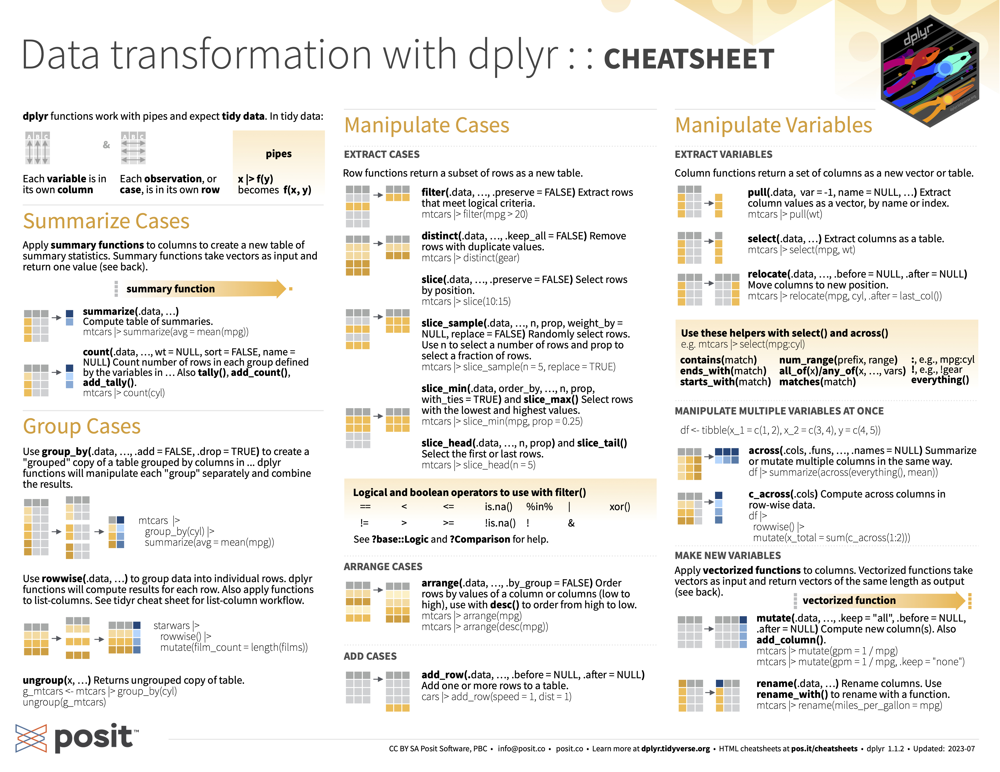
</div>

<div align="center">
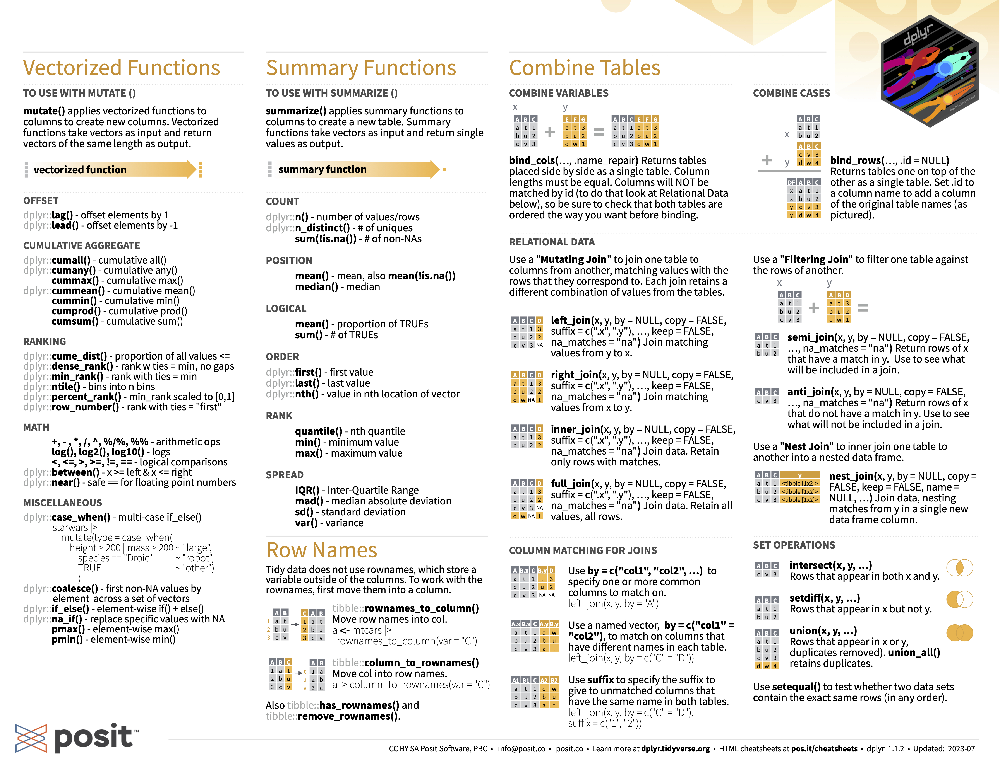
</div>

## Weiterführend

### Nützliche statistische Funktionen für [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html)

Wie weiter oben beschrieben, können wir allerlei nützliche statistische Funktionen in Kombination mit [`summarise()`](https://dplyr.tidyverse.org/reference/summarise.html) verwenden. Im Folgenden werden diese Funktionen nochmal aufgezählt und kurz erläutert.

* Grundfunktionen
    * Durchschnitt: [`mean()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/mean) - Berechnet den Durchschnitt der Elemente eines Vektors.
    * Median: [`median()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/median) - Gibt den Median der Elemente eines Vektors zurück.
    * Summe: [`sum()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/sum) - Summiert alle Elemente eines Vektors.
    * prozentueller Anteil: `x / sum(x)` - Gibt den prozentualen Anteil jedes Elements im Vergleich zur Gesamtsumme zurück.
* Varianz
    * Standardabweichung: [`sd()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/sd) - Berechnet die Standardabweichung eines Vektors.
    * Interquartilsabstand: [`IQR()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/IQR) - Berechnet den Abstand zwischen dem 1. und 3. Quartil eines Vektors.
    * Mittlere absolute Abweichung: [`mad()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/mad) - Gibt die mittlere absolute Abweichung eines Vektors zurück.
    * Quantile erstellen: [`quantile()`](https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/quantile) - Gibt spezifische Quantilwerte für einen Vektor zurück.
    * Z-Score: `(x - mean(x)) / sd(x)` - Transformiert Datenpunkte in Z-Scores basierend auf Mittelwert und Standardabweichung.
* Reichweite
    * Minimalwert: [`min()`](https://www.rdocumentation.org/packages/rapportools/versions/1.1/topics/min) - Gibt den kleinsten Wert eines Vektors zurück.
    * Maximalwert: [`max()`](https://www.rdocumentation.org/packages/rapportools/versions/1.1/topics/max) - Gibt den größten Wert eines Vektors zurück.
    * Normalisierung auf den Bereich `[0, 1]`: `(x - min(x)) / (max(x) - min(x))` - Normalisiert die Daten eines Vektors auf den Bereich zwischen 0 und 1.
* Position
    * erster Wert: [`first()`](https://dplyr.tidyverse.org/reference/nth.html) - Gibt den ersten Wert eines Vektors zurück.
    * letzter Wert: [`last()`](https://dplyr.tidyverse.org/reference/nth.html) - Gibt den letzten Wert eines Vektors zurück.
    * n-ter Wert: [`nth()`](https://dplyr.tidyverse.org/reference/nth.html) - Gibt den n-ten Wert eines Vektors zurück.
* Anzahl
    * Anzahl: [`n()`](https://dplyr.tidyverse.org/reference/context.html) - Gibt die Anzahl der Elemente in einem Vektor zurück.
    * Anzahl einzigartiger Werte: [`n_distinct()`](https://dplyr.tidyverse.org/reference/n_distinct.html) - Zählt die Anzahl der einzigartigen Werte in einem Vektor.
* Logical
    * [`any()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/any) - Überprüft, ob mindestens ein Element eines logischen Vektors `TRUE` ist.
    * [`all()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/all) - Überprüft, ob alle Elemente eines logischen Vektors `TRUE` sind.
* Kumulative Funktionen
    * kumulative Summe: [`cumsum()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/cumsum) - Gibt einen Vektor mit kumulierten Summen zurück.
    * kumulatives Produkt: [`cumprod()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/cumsum) - Gibt einen Vektor mit kumulierten Produkten zurück.
* Sonstige
    * Runden: [`round()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/Round) - Rundet die Zahlen eines Vektors auf eine angegebene Anzahl von Dezimalstellen.

### [`slice_`](https://dplyr.tidyverse.org/reference/slice.html)

Es gibt fünf praktische Funktionen, die man ebenfalls auf `groups` anwenden kann - die [`slice_`](https://dplyr.tidyverse.org/reference/slice.html)-Funktionen.

* `df %>% slice_head(n = 1)` behält die erste Zeile von jeder Gruppe
* `df %>% slice_tail(n = 1)` behält die letzte Zeile von jeder Gruppe
* `df %>% slice_min(x, n = 1)` behält die Zeile mit dem kleinsten Wert der Spalte `x`
* `df %>% slice_max(x, n = 1)` behält die Zeile mit dem größten Wert der Spalte `x`
* `df %>% slice_sample(n = 1)` behält eine zufällig ausgewählte Zeile

Das Argument `n` kann angepasst werden, wenn mehr als eine Zeile ausgewählt werden soll. Es gibt auch die Möglichkeit, stattdessen einen prozentualen Anteil mithilfe des Arguments `prop` ausgeben (also z.B. 10% mithilfe von `prop = 0.1`).

Beispielhaft können wir die Flüge pro Zielflughafen ausgeben, die die größte Verspätung haben:

In [ ]:
flights %>%
    group_by(dest) %>%
    slice_max(arr_delay, n = 1) %>%
    relocate(dest) %>% # wir benutzen hier die Funktion relocate(), um die Spalte dest nach ganz vorne zu schieben
    glimpse()

In diesem Beispiel werden 108 Zeilen ausgegeben, obwohl es nur 105 Gruppen gibt. Das liegt daran, dass manche Ergebnisse sich den "ersten Platz teilen" (`slice_max()` gibt alle Ergebnisse aus, die den höchsten Wert annehmen). Wenn man das vermeiden möchte, kann das Argument `with_ties = FALSE` hinzugefügt werden.

Der Vorteil von `slice_` im Gegensatz zu Funktionen wie `max()` ist, dass die gesamte Zeile pro Gruppe ausgegeben wird (im Gegensatz zur statistischen Zusammenfassung bei `max()`).